# Examine PARP inhib AD 02 structures, Jeff-corrected structures, and Pat Walters filters on these structures
Notes:

AMPL: `git checkout highlight_smarts` which has updated rdkit_easy.py

rd_filters: `git clone https://github.com/paulsonak/rd_filters.git`

Your current ampl env: `pip install docopt`

`sys.path.append` path to rd_filters repo below

In [2]:
import pandas as pd
# import rdkit
import numpy as np
import sys
import os

# input path to cloned repo here
rd_filter_path="/g/g16/apaulson/github_repos/rd_filters/rd_filters"

sys.path.append(rd_filter_path)
import rd_filters as rdf
from atomsci.ddm.utils import rdkit_easy
%config Completer.use_jedi=False

In [3]:
import rdkit
rdkit.__version__

'2022.03.1'

In [4]:
rdkit_easy.setup_notebook()

Loading BokehJS ...

# Filter Molecules

In [5]:
rd_filter_data_path=os.path.join(rd_filter_path,'data')

In [6]:
rdf.filter_mols?

Signature: rdf.filter_mols(cmd_input, verbose=True)
Docstring:
A function to replicate the command line functionality in a jupyter notebook.
Args:
    cmd_input (dict): input dict of options {
        (template|filter):boolean, 
        out: a file location for creating a template,
        in: an input .smi file, 
        data_path: a path to the directory of alerts and template files, 
        rules: label for which template file to use, 
        prefix: an indicator of where to save filtering info and what to call it, 
        num_cores: number of cores to use with default all cores, 
        alerts: a file name indicating which alerts to use instead of a template
        }
    verbose (bool): whether to print comments
Returns
    None
Effects:
    Saves template to out or filter info to prefix
File:      ~/github_repos/rd_filters/rd_filters/rd_filters.py
Type:      function


In [7]:
rules=rdf.get_rules_files(rd_filter_data_path)
del rules['rules']
rules

{'all': 'all.json',
 'bms': 'bms.json',
 'dundee': 'dundee.json',
 'glaxo': 'glaxo.json',
 'inpharmatica': 'inpharmatica.json',
 'lint': 'lint.json',
 'mlsmr': 'mlsmr.json',
 'pains': 'pains.json',
 'surechembl': 'surechembl.json'}

In [8]:
for rulename in rules.keys():
    cmd_input={
        "filter":True, # required
        "in":"/usr/workspace/atom/PARP_compounds/filter_gmd/parp_inhib_AD_02_best_500_cluster_reps.smi",
        "prefix":f"/usr/workspace/atom/PARP_compounds/filter_gmd/parp_500_rd_filtered/{rulename}", # output directory must already exist
        "data_path" : rd_filter_data_path,
        "rules" : rulename,
        'num_cores':4
    }
    rdf.filter_mols(cmd_input, verbose=False)
print('Completed filtering')

Completed filtering


# Visualize filters and molecules
## note: filtering algorithm stops at first alert encountered and they're not in any order of importance

In [9]:
outdir='/usr/workspace/atom/PARP_compounds/filter_gmd/parp_500_rd_filtered/'
surechembl=pd.read_csv(f'{outdir}surechembl.csv')
print(surechembl.shape)
surechembl.head()

(500, 9)


,SMILES,NAME,FILTER,MW,LogP,HBD,HBA,TPSA,Rot
0,C=C1C2C=C(N)C(Cl)=CC2=NN1C1CCCC(N)C1(C)Cl,171_875,Ethene > 0,327.259,2.6441,2,4,67.64,1
1,C=C(CN1CCCCC1)C1=CC(=C)C2C=C(N)C(Cl)=CC2=C1Cl,151_32,polyenes > 0,349.305,4.6127,1,2,29.26,3
2,C=CC1(N)NCCC(=CC2C(=C)C(Cl)=Cc3c2cc(Cl)nc3Cl)C...,192_297,"halo-pyridine,_-diazoles_and_-triazoles > 0",408.760,5.3285,2,3,50.94,2
3,C=C1C(N)CCC(=CC2C(=C)C(Cl)=Cc3c2ccnc3Cl)C1N,198_185,"halo-pyridine,_-diazoles_and_-triazoles > 0",348.277,3.8991,2,3,64.93,1
4,C=CC=C1C(=CC2C(=C)C(Cl)=Cc3c2ccnc3Cl)CCNC1(N)C=C,178_631,"halo-pyridine,_-diazoles_and_-triazoles > 0",386.326,4.8412,2,3,50.94,3


,SMILES,NAME,FILTER,MW,LogP,HBD,HBA,TPSA,Rot,smarts,FilterMol,FilteredMol
0,C=C1C2C=C(N)C(Cl)=CC2=NN1C1CCCC(N)C1(C)Cl,171_875,Ethene > 0,327.259,2.6441,2,4,67.64,1,C=[CH2],,
1,C=C(CN1CCCCC1)C1=CC(=C)C2C=C(N)C(Cl)=CC2=C1Cl,151_32,polyenes > 0,349.305,4.6127,1,2,29.26,3,C=CC=CC=CC=C,,

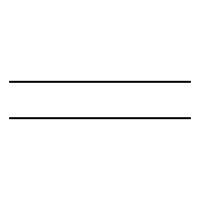
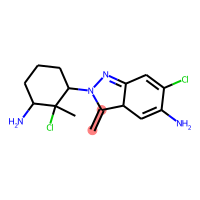
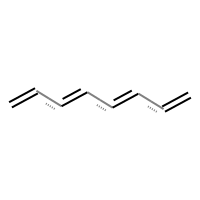
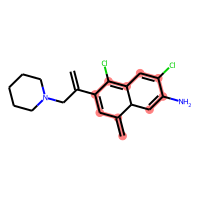

In [10]:
rdf.add_filter_col_to_df(surechembl, 'FILTER', rules=['SureChEMBL'])
rdf.add_filtered_mol_col_to_df(surechembl, 'SMILES', 'FILTER', rules=['SureChEMBL'])
rdkit_easy.show_df(surechembl.head(2))

# Examine filters and overlaps

### what filters failed molecules most often?

In [11]:
fails=pd.read_csv(f'{outdir}all.csv')
filtercounts=pd.DataFrame(fails.FILTER.value_counts()).reset_index()
filtercounts.columns=['FILTER','count']

,FILTER,count,smarts,FilterMol
0,N2 Polyenes > 0,117,C=CC=CC=CC=C,
1,Polyene > 0,85,C=!@CC=!@C,

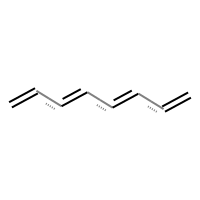
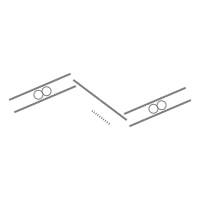

In [12]:
rdf.add_filter_col_to_df(filtercounts, df_filter_col='FILTER', rules=['all'])
rdkit_easy.show_df(filtercounts.head(2))

### what molecules were filtered by multiple sets?
`pip install supervenn`

In [13]:
import matplotlib.pyplot as plt
import supervenn as spv

In [14]:
smiles={}
for file in os.listdir(outdir):
    if 'csv' in file:
        tmp=pd.read_csv(os.path.join(outdir,file))
        if 'all' in file:
            smiles['all']=set(tmp.SMILES)
        else:
            smiles[file.replace('.csv','')]=set(tmp[tmp.FILTER!='OK'].SMILES)
smiles.keys()

dict_keys(['all', 'bms', 'dundee', 'glaxo', 'inpharmatica', 'lint', 'mlsmr', 'pains', 'surechembl'])

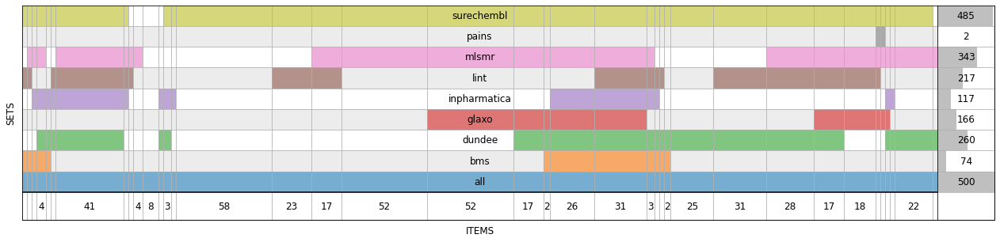

In [15]:
fig, ax=plt.subplots(1, figsize=(22,5))
spv.supervenn(list(smiles.values()), set_annotations=list(smiles.keys()), 
              ax=ax, side_plots='right', min_width_for_annotation=2, widths_minmax_ratio=0.05);

### What SMARTS overlap in rule sets?

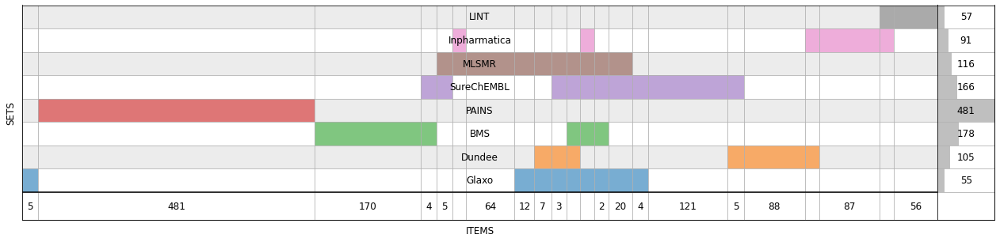

In [16]:
alerts=pd.read_csv(os.path.join(rd_filter_data_path, 'alert_collection.csv'))
smarts={}
for ruleset in alerts.rule_set_name.unique():
    smarts[ruleset]=set(alerts[alerts.rule_set_name==ruleset].smarts)
fig, ax=plt.subplots(1, figsize=(22,5))
spv.supervenn(list(smarts.values()), set_annotations=list(smarts.keys()), 
              ax=ax, side_plots='right', min_width_for_annotation=2, widths_minmax_ratio=0.05);

# Bokeh table of filtered df

In [17]:
# ensure highlighting persists through to html - only works for type png and embed true right now
surechembl['FilterMol_html']=surechembl.FilterMol.apply(rdkit_easy.mol_to_html, type='png', embed=True)
surechembl['FilteredMol_html']=[rdkit_easy.mol_to_html(mol=x, type='png', embed=True, name=y, highlight=z) for (x, y, z) in zip(surechembl.FilteredMol.tolist(), surechembl.NAME, surechembl.FilterMol)]

,SMILES,NAME,FILTER,MW,LogP,HBD,HBA,TPSA,Rot,smarts,FilterMol,FilteredMol,FilterMol_html,FilteredMol_html
0,C=C1C2C=C(N)C(Cl)=CC2=NN1C1CCCC(N)C1(C)Cl,171_875,Ethene > 0,327.259,2.6441,2,4,67.64,1,C=[CH2],,,,
1,C=C(CN1CCCCC1)C1=CC(=C)C2C=C(N)C(Cl)=CC2=C1Cl,151_32,polyenes > 0,349.305,4.6127,1,2,29.26,3,C=CC=CC=CC=C,,,,
2,C=CC1(N)NCCC(=CC2C(=C)C(Cl)=Cc3c2cc(Cl)nc3Cl)C1=CC,192_297,"halo-pyridine,_-diazoles_and_-triazoles > 0",408.760,5.3285,2,3,50.94,2,"[Cl,Br,I]c1[c,n][c,n][c,n][c,n]n1",,,,
3,C=C1C(N)CCC(=CC2C(=C)C(Cl)=Cc3c2ccnc3Cl)C1N,198_185,"halo-pyridine,_-diazoles_and_-triazoles > 0",348.277,3.8991,2,3,64.93,1,"[Cl,Br,I]c1[c,n][c,n][c,n][c,n]n1",,,,
4,C=CC=C1C(=CC2C(=C)C(Cl)=Cc3c2ccnc3Cl)CCNC1(N)C=C,178_631,"halo-pyridine,_-diazoles_and_-triazoles > 0",386.326,4.8412,2,3,50.94,3,"[Cl,Br,I]c1[c,n][c,n][c,n][c,n]n1",,,,

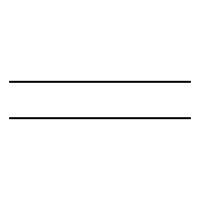
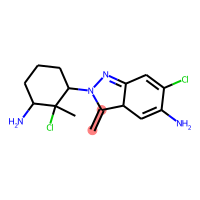
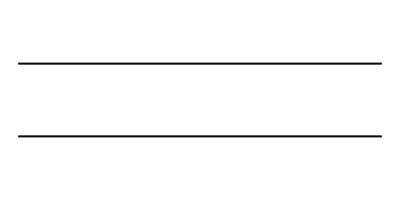
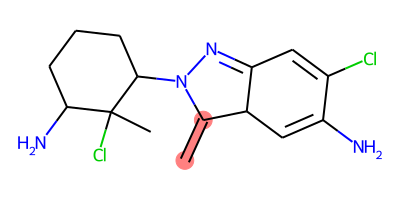
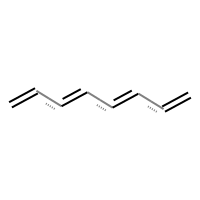
...
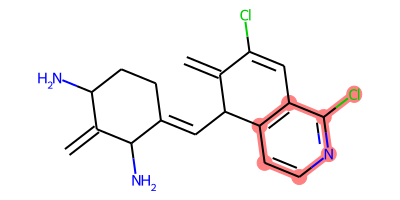
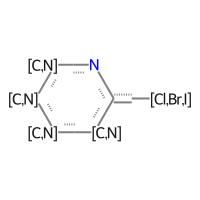
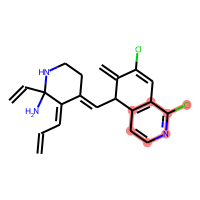
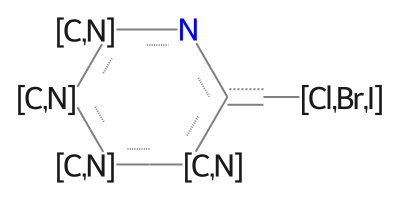
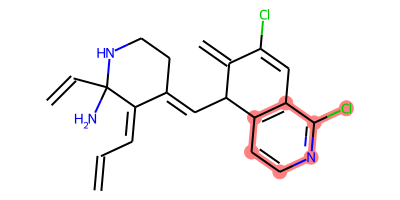

In [18]:
# double check highlighting works when transferring to html
rdkit_easy.show_df(surechembl.head())

,SMILES,NAME,FILTER,MW,LogP,HBD,HBA,TPSA,Rot,smarts,FilterMol,FilteredMol,FilterMol_html,FilteredMol_html
495,C=C1N=CC(C(=C)C=C2CCNc3c(OC)c(Cl)cc(Cl)c32)=C(N)N1,145_816,Polyene > 0,377.275,4.07270,3,5,71.67,3,C=!@CC=!@C,,,,
496,C=C(C1=NNC(=CC2C(=C)C=CC=C2Cl)C1c1ccccc1Cl)c1cnn(C)c1C,187_259,Ethene > 0,437.374,5.88692,1,4,42.21,4,C=[CH2],,,,
497,C=C1C=CC=C(N)C1C(=C)C=C1CCN(C(=C)C)c2c(Cl)ccc(Cl)c21,116_329,Polyene > 0,385.338,6.26150,1,2,29.26,3,C=!@CC=!@C,,,,
498,C=C1C(Cl)=Cc2c(ccnc2Cl)C1C=C1C=C(c2ccc3ncccc3c2)CCN1C(=C)C,203_380,"halo-pyridine,_-diazoles_and_-triazoles > 0",472.419,7.72310,0,3,29.02,3,"[Cl,Br,I]c1[c,n][c,n][c,n][c,n]n1",,,,
499,C=C(C=C1Nc2c(ccc(C=C(C)c3nnc(C)s3)c2Cl)CC1Cl)C1=C(N)CCNC1C,98_36,alkyl_halides > 0,488.488,5.67052,3,6,75.86,4,"[Br,Cl,I][CX4;CH,CH2]",,,,

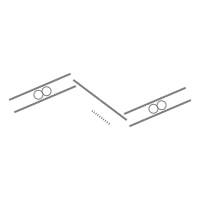
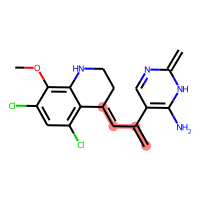
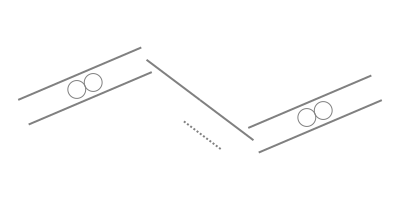
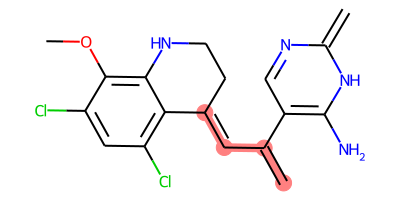
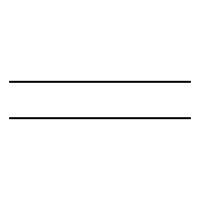
...
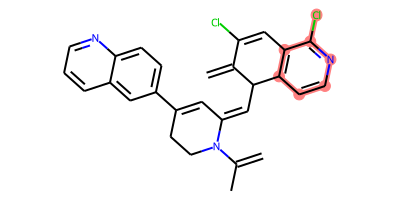
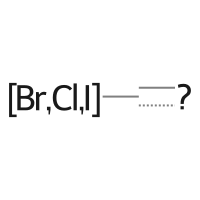
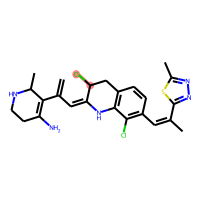
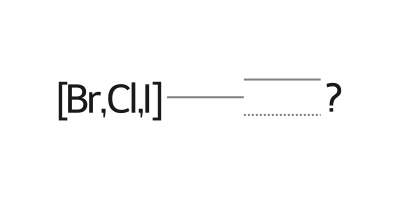
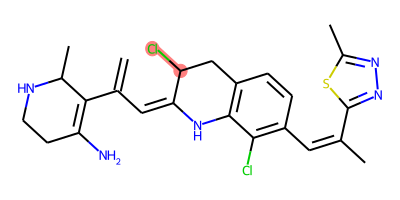

In [19]:
rdkit_easy.show_df(surechembl.tail())

In [25]:
# Bokeh
# # Import modules and set options
from bokeh.layouts import grid, layout
from bokeh.models import ColumnDataSource, CategoricalColorMapper, annotations, Div
from bokeh.models.widgets import DataTable, TableColumn, HTMLTemplateFormatter
from bokeh.plotting import figure, output_notebook, show, output_file, save
from bokeh.palettes import all_palettes
from bokeh.transform import linear_cmap
colors = ["#6EC8BE","#BE2369","#FFC30F","#694691","#EB1E23","#7682A4","#373C50","#A7DDD8",]

output_file(filename=f"{outdir}explore_molecule_filters.html", title="Explore filters on molecules")

y = 'MW'
x = 'LogP'
z = 'HBA'
w= 'HBD'
color = 'TPSA'

tooltips = """
    <div>
        <div>
            @FilteredMol_html{safe}<br>
        </div>
        <div>
            <span style="font-size: 15px; font-weight: bold;">Compound: @NAME</span><br>
        </div>
    </div>
"""

df=surechembl

# Bokeh can't handle RDKit mol
mol_filter = (df.columns != 'FilterMol') & (df.columns != 'FilteredMol')

# Shared source
source = ColumnDataSource(df.loc[:,mol_filter])   ### filtered for only some data even though clusters calc'd on all

fig = figure(title="MolWt vs LogP shaded by TPSA", tooltips=tooltips, y_range=(200,600), x_range=(0,10), plot_width=360, 
             plot_height=360, tools='box_select,lasso_select,tap,pan,wheel_zoom,box_zoom,save,reset,help', 
             sizing_mode='scale_width'
            )
fig2 = figure(title="HBA vs HBD shaded by TPSA", tooltips=tooltips, y_range=(-1,5), x_range=(-1,7),  plot_width=360, 
             plot_height=360, tools='box_select,lasso_select,tap,pan,wheel_zoom,box_zoom,save,reset,help', 
             sizing_mode='scale_width'
            )

# Color by cluster
colormap = linear_cmap(field_name=color, palette='Viridis256', low=min(df[color]), high=max(df[color]))

# color_map = CategoricalColorMapper(factors=df[color].value_counts().index, palette=all_palettes['Plasma'][256])

r = fig.scatter(x=x, y=y, source=source, size=5, 
                color=colormap,
                # color={'field':color, 'transform':color_map},
                # legend_group=color
               )
fig.xaxis.axis_label = x
fig.yaxis.axis_label = y

q = fig2.scatter(x=z, y=w, source=source, size=5, color=colormap,
                # color={'field':color, 'transform':color_map},
                # legend_group=color
               )
fig2.xaxis.axis_label = z
fig2.yaxis.axis_label = w

# For HTML in DataTable
html_template = HTMLTemplateFormatter(template='<%= value %>')

columns = [TableColumn(field="NAME", title='Name'),
           TableColumn(field="FILTER", title='Filter Name'),
           TableColumn(field="FilterMol_html", formatter=html_template, title='Filter', ),
           TableColumn(field="FilteredMol_html", formatter=html_template, title='Compound', ),           
           TableColumn(field='MW', title='MolWt', ),
           TableColumn(field='HBD', title='NumHDon'),
           TableColumn(field='HBA', title='NumHAcc'),
           TableColumn(field='LogP', title='MolLogP'),
           TableColumn(field='Rot', title='NumRotBonds'),
           TableColumn(field='TPSA', title='TPSA'),]

table = DataTable(source=source, columns=columns, row_height=150, sizing_mode='stretch_width', selectable='checkbox', 
                  height=450, 
                  # title="Explore monophores for HCMV and HSV1 assays",
                  autosize_mode='fit_columns')

# Show
g = grid([
    [Div(text="<b>Explore Filters for GMD Compounds</b>", style={'font-size': '30px', 'font-weight': 'bold'})], 
    # [Div(text=venn_tag), Div(text=vals_tag),fig,fig2],
    [fig, fig2],
    [table],
    ], 
    # sizing_mode="stretch_width"
)
# save(g, mode='inline')
show(g)

# Draw jeff corrected mol's

In [26]:
# jeff selected & corrected from parp_inhib_AD_02_best_500_cluster_reps
jeff_smiles={
"171_10": "C=C1C(C=C2CCNCC2=Cc2ccc(C)c(F)c2Cl)=Cc2cnn(C)c2C1O",
"131_790":"NC1=NNC(=CC=C2CCNC(N)C2=Cc2ccccc2Cl)C1C1=C(Cl)CCC=C1",
"152_283":"C=C(C=C1CC(N)=NN1)C=C1C(=C(C)CF)C(C)Nc2c(F)ccc(Cl)c21",
"183_780":"C=C1C(Cl)=Cc2c(ccnc2Cl)C1C=C1Cc2c(Cl)cccc2C(N)C1C",
"150_289":"C=C1C(C=C2CC(c3ccncc3Cl)=NN2C)=Cc2c(ccnc2Cl)C1Cl",
"200_188":"C=CN1N=C2C=C(Cl)C(N)=CC2C1=CC(=C)C(=C)c1c(Cl)n[nH]c1Cl",
"145_514":"C=C(C1=NN(C)C(=CC2=Cc3c(ccnc3N)C(O)C2=C)C1)c1cccc(Cl)c1Cl",
"179_722":"C=C(C)C1C(N)=NNC1c1cc2c(Cl)ccc(O)c2cc1Cl",
"187_11": "C=C(C=C1Cc2nncn2-c2c(Cl)ccc(Cl)c21)C1=Cc2c(ccnc2Cl)C(C)C1=C"
}
jeff_corr_smiles={
"171_10": "OC1=C(C)C(CC2=C(CC3=C(Cl)C(F)=C(C)C=C3)C=NC=C2)=CC4=C1N(C)N=C4",
"131_790":"NC1=C(C2=C(Cl)C=CC=C2)C(CCC3=C(CC4=CC=CC=C4Cl)C(N)=NC=C3)=NN1",
"152_283":"CC1=NC2=C(F)C=CC(Cl)=C2C(CCCC3=CC(N)=NN3)=C1C(CF)C",
"183_780":"ClC1=C2C(C(N)=C(C)C(CC3=C(C)C(Cl)=CC4=C(Cl)N=CC=C43)=C2)=CC=C1",
"150_289":"ClC1=CN=CC=C1C2=NN(C)C(CC3=CC4=C(Cl)N=CC=C4C(Cl)=C3C)=C2",
"200_188":"NC1=CC2=C(C/C=C/C3=C(Cl)NN=C3Cl)N(C=C)N=C2C=C1Cl",
"145_514":"NC1=C(C=C(CC2=CC(C(C3=C(Cl)C(Cl)=CC=C3)C)=NN2C)C(C)=C4O)C4=CC=N1",
"179_722":"OC1=CC=C(Cl)C2=CC(C3=C(C(C)=C)C(N)=NN3)=C(Cl)C=C21",
"187_11": "ClC1=NC=CC(C(C)=C2C)=C1C=C2/C=C/C3=CC4=NN=CN4C5=C3C(Cl)=CC=C5Cl"
}

In [27]:
# parp_inhib_AD_02_best_500_cluster_reps passed filters (5 molecules)
df=pd.read_csv(f'{outdir}all.smi', sep=' ', header=None)
df.columns=['smiles','compound_id']
smiles=dict(zip(df.compound_id, df.smiles))
smiles

# jeff corrected some - last one "not fixable"
corr_smiles={'168_245': 'NC1=CC2=C(C=C1Cl)C(C(Cc3c(Cl)cccc3)CC4)=C4C=N2',
 '121_36': 'NCC1=C(Cl)C2C(=CC3=C(N)CCC3)C3=C(CCC3)C2C=C1',
 '148_179': 'NC1CNCC1CC2=C(NC3=CC=CC=C23)c4c(Cl)c(Cl)ccc4',
 '72_356': 'CC(c1c(Cl)cccc1)Nc2nc(C)nc3c2C=C(C)C(C3=C(C)N4)=C4N'}

In [29]:
rdf.draw_structures?

Signature: rdf.draw_structures(smiles_dict, corr_smiles_dict, save=False, outdir='./')
Docstring: <no docstring>
File:      ~/github_repos/rd_filters/rd_filters/rd_filters.py
Type:      function


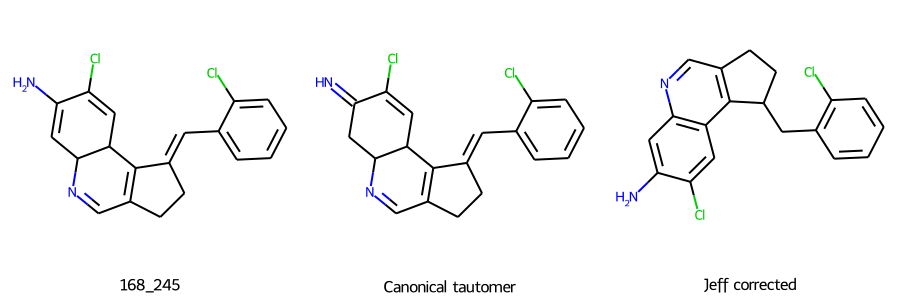

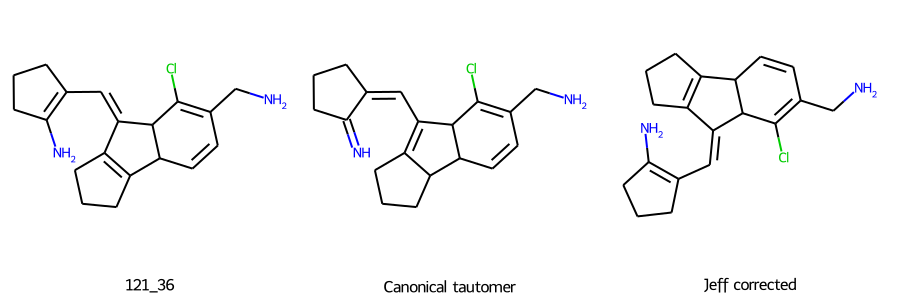

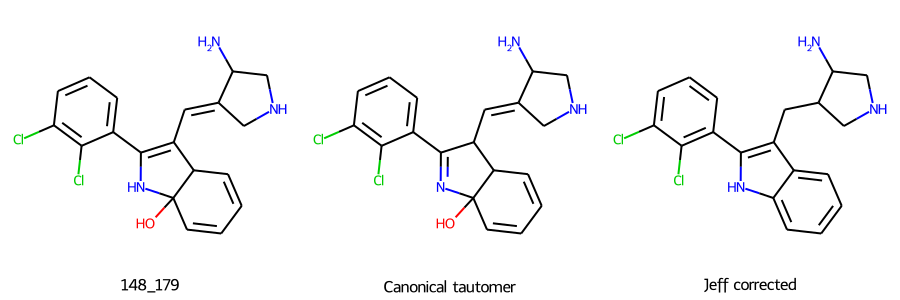

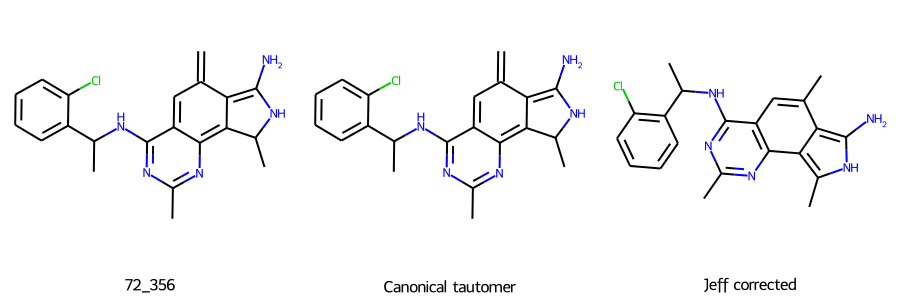

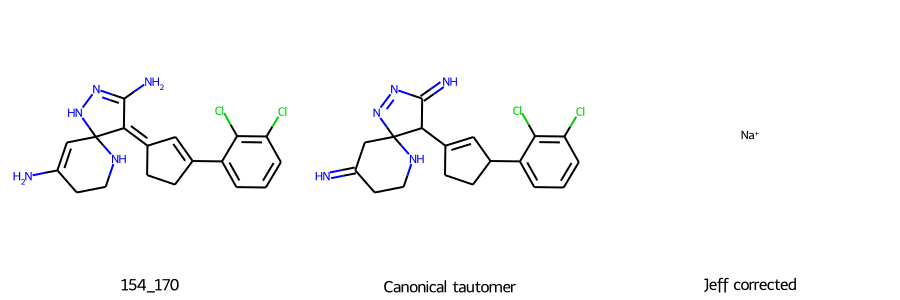

In [28]:
rdf.draw_structures(smiles, corr_smiles)

# Look at other tautomer options for a single structure

In [30]:
fails.head(2)

,SMILES,NAME,FILTER,MW,LogP,HBD,HBA,TPSA,Rot
0,C=C1C2C=C(N)C(Cl)=CC2=NN1C1CCCC(N)C1(C)Cl,171_875,alkyl halide > 0,327.259,2.6441,2,4,67.64,1
1,C=C(CN1CCCCC1)C1=CC(=C)C2C=C(N)C(Cl)=CC2=C1Cl,151_32,N2 Polyenes > 0,349.305,4.6127,1,2,29.26,3


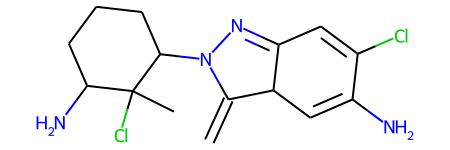

,TautSmiles,TautScore,ROMol
3,C=C1c2cc(N)c(Cl)cc2NN1C1CCCC(N)C1(C)Cl,251,
2,C=C1C2CC(=N)C(Cl)=CC2=NN1C1CCCC(N)C1(C)Cl,3,
0,C=C1C2=C(C=C(Cl)C(=N)C2)NN1C1CCCC(N)C1(C)Cl,2,
1,C=C1C2C=C(N)C(Cl)=CC2=NN1C1CCCC(N)C1(C)Cl,2,

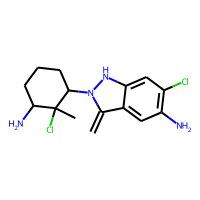
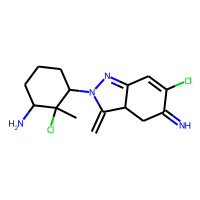
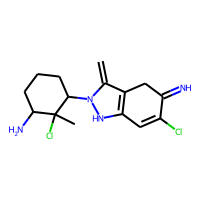
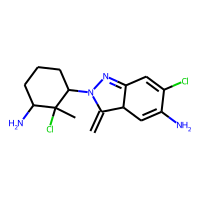

In [31]:
# look at other options for tautomers
mol=rdkit.Chem.MolFromSmiles(fails.SMILES[0])
display(mol)
rdkit_easy.show_df(rdf.get_tautomer_dataframe(mol))